In [6]:
def get_all_functions(kegg_file):
    with open(kegg_file, "r") as keggfile:
        gene2function = {}
        for line in keggfile.readlines()[2:]:
            gene_func_list = line.split()[6:]
            gene_func = " ".join(filter(lambda x: "." not in x, gene_func_list))
            gene_name = line.split()[1]
            gene2function[gene_name] = gene_func
    return gene2function

In [7]:
import pandas as pd

In [8]:
def extract_functions_from_kegg(kegg_files, gene_matrix, bacterias):    
    genematrix = pd.read_csv(gene_matrix)
    list_of_clustered_genes = genematrix["geneNames"]
    
    genes = []
    
    if len(bacterias) == 1:
        
        bacteria = bacterias[0]
        print("Genes unique for ", bacteria)
        kegg_file = kegg_files[0]
        list_of_absence = list(genematrix[bacteria].values)
        
        all_bacteria = ["p13", "p50071", "p8", "p4", "p3"]
        other_bacteria = list(set(all_bacteria) - set(bacterias))
        list_of_absence2 = list(genematrix[other_bacteria[0]].values)
        list_of_absence3 = list(genematrix[other_bacteria[1]].values)
        list_of_absence4 = list(genematrix[other_bacteria[2]].values)
        list_of_absence5 = list(genematrix[other_bacteria[3]].values)
        
        for i in range(len(list_of_absence)):
            if list_of_absence[i] == 1 and list_of_absence2[i] == 0 and list_of_absence3[i] == 0 and list_of_absence4[i] == 0 and list_of_absence5[i] == 0:
                genes.append(list_of_clustered_genes[i])
                
        dict1 = get_all_functions(kegg_files[0])
        dict2 = get_all_functions(kegg_files[1])
        dict3 = get_all_functions(kegg_files[2])
        dict4 = get_all_functions(kegg_files[3])
        dict5 = get_all_functions(kegg_files[4])
            
        all_functions_dict = {**dict1, **dict2, **dict3, **dict4, **dict5}
                
        gene2function = {}
        for i in range(len(genes)):
            if genes[i] in all_functions_dict.keys():
                gene2function[genes[i]] = all_functions_dict[genes[i]]  
        return gene2function
    
    else:
        bacteria1 = bacterias[0]
        bacteria2 = bacterias[1]
        print("Genes overlap for ", bacteria1, bacteria2)
        kegg_file1 = kegg_files[0]
        kegg_file2 = kegg_files[1]
        list_of_absence1 = list(genematrix[bacteria1].values)
        list_of_absence2 = list(genematrix[bacteria2].values)
        all_bacteria = ["p13", "p50071", "p8", "p4", "p3"]
        other_bacteria = list(set(all_bacteria) - set(bacterias))
        list_of_absence3 = list(genematrix[other_bacteria[0]].values)
        list_of_absence4 = list(genematrix[other_bacteria[1]].values)
        list_of_absence5 = list(genematrix[other_bacteria[2]].values) 
        
        for i in range(len(list_of_absence1)):
            if list_of_absence1[i] == 1 and list_of_absence2[i] == 1 and list_of_absence3[i] == 0 and list_of_absence4[i] == 0 and list_of_absence5[i] == 0:
                genes.append(list_of_clustered_genes[i])
                
        dict1 = get_all_functions(kegg_files[0])
        dict2 = get_all_functions(kegg_files[1])
        dict3 = get_all_functions(kegg_files[2])
        dict4 = get_all_functions(kegg_files[3])
        dict5 = get_all_functions(kegg_files[4])
        
        all_functions_dict = {**dict1, **dict2, **dict3, **dict4, **dict5}        
         
        gene2function = {}
        for i in range(len(genes)):
            if genes[i] in all_functions_dict.keys():
                gene2function[genes[i]] = all_functions_dict[genes[i]]   
        
        return gene2function

    

In [10]:
p13gene_dict = extract_functions_from_kegg(["./kegg_results/p13kegg.txt", "./kegg_results/p50071kegg.txt", "./kegg_results/p8kegg.txt", "./kegg_results/p4kegg.txt", "./kegg_results/p3kegg.txt"], "./final_data2/raw/30_70_genematrices/genematrix30id.csv", ["p13"])

Genes unique for  p13


In [11]:
p50071gene_dict = extract_functions_from_kegg(["./kegg_results/p13kegg.txt", "./kegg_results/p50071kegg.txt", "./kegg_results/p8kegg.txt", "./kegg_results/p4kegg.txt", "./kegg_results/p3kegg.txt"], "./final_data2/raw/30_70_genematrices/genematrix30id.csv", ["p50071"])

Genes unique for  p50071


In [12]:
p3gene_dict = extract_functions_from_kegg(["./kegg_results/p13kegg.txt", "./kegg_results/p50071kegg.txt", "./kegg_results/p8kegg.txt", "./kegg_results/p4kegg.txt", "./kegg_results/p3kegg.txt"], "./final_data2/raw/30_70_genematrices/genematrix30id.csv", ["p3"])

Genes unique for  p3


In [13]:
p4gene_dict = extract_functions_from_kegg(["./kegg_results/p13kegg.txt", "./kegg_results/p50071kegg.txt", "./kegg_results/p8kegg.txt", "./kegg_results/p4kegg.txt", "./kegg_results/p3kegg.txt"], "./final_data2/raw/30_70_genematrices/genematrix30id.csv", ["p4"])

Genes unique for  p4


In [14]:
p8gene_dict = extract_functions_from_kegg(["./kegg_results/p13kegg.txt", "./kegg_results/p50071kegg.txt", "./kegg_results/p8kegg.txt", "./kegg_results/p4kegg.txt", "./kegg_results/p3kegg.txt"], "./final_data2/raw/30_70_genematrices/genematrix30id.csv", ["p8"])

Genes unique for  p8


In [57]:
from urllib.request import urlopen
from bs4 import BeautifulSoup
import re
from tqdm import tqdm

def get_kegg_annotation(gene2function_dict, kegg_files):
    if len(kegg_files) == 1:
        kegg_file = kegg_files[0]
        keys_to_check = []
        for elt in gene2function_dict.keys():
            the_key = elt
            keys_to_check.append(the_key)
        annotation_dict = {}
        with open(kegg_file, "r") as keggfile:
            for line in tqdm(keggfile.readlines()[2:]):
                gene_name = line.split()[1]
                if gene_name in keys_to_check:
                    KO = line.split()[2]
                    #print(KO)
                    kegg_html = urlopen("https://www.genome.jp/entry/"+KO).read()
                    soup = BeautifulSoup(kegg_html, features = "html.parser")
                    
                    for script in soup(["script", "style"]):
                        script.extract()
                        
                    text = soup.get_text()
                    
                    lines = (line.strip() for line in text.splitlines())
                    chunks = (phrase.strip() for line in lines for phrase in line.split("  "))
                    
                    text = '\n'.join(chunk for chunk in chunks if chunk)
                    
                    if "Brite" in text:
                        print(KO)
                        sub1 = "[BR:ko00001]"
                        sub2 = "Other DBs"
                        
                        idx1 = text.index(sub1)
                        idx2 = text.index(sub2)
                        
                        res = ''
                        
                        for idx in range(idx1 + len(sub1) + 1, idx2):
                            res = res + text[idx]
                            
                        pathway_list = res.split()
                        pathway_list = [x for x in pathway_list if not x.isdigit()]
                        
                        if 'Brite' == pathway_list[0]:
                            annotation_dict[gene_name] = pathway_list[5]
                            print(pathway_list[5], 'Brite')
                        if 'Not' == pathway_list[0]:
                            annotation_dict[gene_name] = pathway_list[8]
                            print(pathway_list[8], 'Not')
                        else:
                            annotation_dict[gene_name] = " ".join(pathway_list[:3])
                            print(pathway_list[:3], 'should be normal')
                        
                        #print(annotation_dict)
                        
    return annotation_dict
                    
            
        
        
        
        
        
        
        
        
        
        
        
        

In [58]:
p13_annotation = get_kegg_annotation(p13gene_dict, ["./kegg_results/p13kegg.txt"])





  0%|                                          | 9/4021 [00:04<30:55,  2.16it/s]

K05835
and Brite
['Brite', 'Hierarchies', 'Protein'] should be normal


  1%|▏                                        | 21/4021 [00:13<44:29,  1.50it/s]

K01547
['Environmental', 'Information', 'Processing'] should be normal


  1%|▏                                      | 23/4021 [00:23<1:25:31,  1.28s/it]

K07646
['Environmental', 'Information', 'Processing'] should be normal


  2%|▊                                        | 85/4021 [00:25<13:44,  4.77it/s]

K04050
and Brite
['Brite', 'Hierarchies', 'Protein'] should be normal


  2%|▉                                        | 96/4021 [00:30<16:18,  4.01it/s]

K07395
information Not


  3%|█                                       | 112/4021 [00:38<20:17,  3.21it/s]

K06076
and Brite
['Brite', 'Hierarchies', 'Protein'] should be normal


  3%|█▏                                      | 121/4021 [00:43<23:15,  2.79it/s]

K00372
['Metabolism', 'Energy', 'metabolism'] should be normal


  3%|█▎                                      | 132/4021 [00:55<34:31,  1.88it/s]

K01886
['Genetic', 'Information', 'Processing'] should be normal


  4%|█▊                                      | 178/4021 [01:01<19:15,  3.33it/s]

K09781
Function Not


  5%|█▊                                      | 186/4021 [01:05<20:51,  3.06it/s]

K02452
['Environmental', 'Information', 'Processing'] should be normal


  5%|██                                      | 211/4021 [01:06<19:59,  3.18it/s]


KeyboardInterrupt: 

In [729]:
p50071_annotation = get_kegg_annotation(p50071gene_dict, ["./kegg_results/p50071kegg.txt"])


  1%|▎                                        | 32/3870 [00:04<08:24,  7.60it/s]

K15125


  5%|█▊                                      | 176/3870 [00:39<13:49,  4.45it/s]

K07497


  7%|██▉                                     | 283/3870 [00:42<07:42,  7.76it/s]

K06596


 11%|████▌                                   | 441/3870 [01:02<07:20,  7.78it/s]

K02358


 19%|███████▋                                | 738/3870 [01:14<04:02, 12.90it/s]

K02575


 19%|███████▊                                | 754/3870 [01:18<04:18, 12.04it/s]

K01004


 21%|████████▏                               | 795/3870 [01:24<04:47, 10.70it/s]

K15539


 26%|██████████▏                            | 1015/3870 [01:45<04:11, 11.35it/s]

K06989


 31%|███████████▉                           | 1187/3870 [02:01<04:06, 10.90it/s]

K00344


 32%|████████████▍                          | 1239/3870 [02:18<06:15,  7.00it/s]

K01057


 33%|████████████▋                          | 1260/3870 [02:35<09:16,  4.69it/s]

K01953


 33%|████████████▋                          | 1261/3870 [02:38<10:11,  4.27it/s]

K24310


 34%|█████████████                          | 1300/3870 [02:42<08:34,  5.00it/s]

K02461


 35%|█████████████▌                         | 1351/3870 [03:02<11:04,  3.79it/s]

K03723


 40%|███████████████▍                       | 1534/3870 [03:22<05:57,  6.53it/s]

K07445


 40%|███████████████▍                       | 1535/3870 [03:51<15:16,  2.55it/s]

K07497


 41%|████████████████                       | 1597/3870 [04:14<14:24,  2.63it/s]

K03704


 43%|████████████████▋                      | 1652/3870 [04:31<13:07,  2.82it/s]

K02040


 45%|█████████████████▍                     | 1728/3870 [04:33<08:00,  4.46it/s]

K03896


 45%|█████████████████▌                     | 1741/3870 [05:05<27:02,  1.31it/s]

K03367


 45%|█████████████████▌                     | 1742/3870 [05:15<41:47,  1.18s/it]

K01066


 45%|████████████████▋                    | 1744/3870 [05:45<1:37:30,  2.75s/it]

K06160


 48%|██████████████████▊                    | 1864/3870 [05:50<07:29,  4.46it/s]

K06077


 51%|███████████████████▊                   | 1965/3870 [06:04<05:39,  5.62it/s]

K08998


 62%|████████████████████████▏              | 2404/3870 [06:12<01:21, 17.99it/s]

K09691


 62%|████████████████████████▏              | 2405/3870 [06:34<02:42,  9.04it/s]

K01784


 62%|████████████████████████▏              | 2406/3870 [06:40<03:11,  7.63it/s]

K02453


 62%|████████████████████████▎              | 2411/3870 [06:42<03:21,  7.25it/s]

K06123


 62%|████████████████████████▎              | 2413/3870 [06:46<03:56,  6.15it/s]

K18301


 67%|██████████████████████████▏            | 2597/3870 [06:58<02:06, 10.10it/s]

K02406


 74%|████████████████████████████▉          | 2867/3870 [07:24<01:37, 10.33it/s]

K02040


 83%|████████████████████████████████▎      | 3208/3870 [07:33<00:36, 17.97it/s]

K05365


 85%|█████████████████████████████████      | 3284/3870 [07:35<00:30, 19.33it/s]

K10954


 89%|██████████████████████████████████▋    | 3441/3870 [07:58<00:36, 11.84it/s]

K01953


 95%|████████████████████████████████████▉  | 3660/3870 [08:14<00:16, 12.36it/s]

K01778


100%|███████████████████████████████████████| 3870/3870 [08:28<00:00,  7.62it/s]

K03455


In [732]:
p8_annotation = get_kegg_annotation(p8gene_dict, ["./kegg_results/p8kegg.txt"])


  5%|██▏                                     | 217/4069 [00:07<02:20, 27.37it/s]

K00124


  9%|███▍                                    | 351/4069 [00:15<02:52, 21.55it/s]

K00595


 13%|█████                                   | 521/4069 [00:36<04:36, 12.83it/s]

K00832


 13%|█████▏                                  | 525/4069 [00:38<05:08, 11.48it/s]

K24259


 18%|███████                                 | 716/4069 [00:51<04:14, 13.16it/s]

K07486


 23%|█████████▏                              | 940/4069 [00:53<02:15, 23.16it/s]

K23475


 29%|███████████▍                           | 1187/4069 [01:03<02:03, 23.42it/s]

K02054


 30%|███████████▋                           | 1222/4069 [01:22<03:54, 12.15it/s]

K02343


 30%|███████████▊                           | 1236/4069 [01:27<04:26, 10.63it/s]

K00407


 35%|█████████████▊                         | 1441/4069 [01:30<02:25, 18.12it/s]

K11383


 38%|██████████████▊                        | 1550/4069 [01:36<02:21, 17.79it/s]

K07679


 46%|█████████████████▊                     | 1852/4069 [01:54<02:08, 17.22it/s]

K09903


 46%|█████████████████▊                     | 1860/4069 [02:09<03:46,  9.75it/s]

K06904


 46%|██████████████████                     | 1884/4069 [02:15<04:20,  8.38it/s]

K09934


 48%|██████████████████▋                    | 1946/4069 [02:40<07:57,  4.44it/s]

K03406


 49%|██████████████████▉                    | 1980/4069 [02:43<06:36,  5.27it/s]

K21024


 50%|███████████████████▌                   | 2039/4069 [03:23<13:48,  2.45it/s]

K01867


 55%|█████████████████████▌                 | 2251/4069 [03:40<05:14,  5.77it/s]

K02899


 66%|█████████████████████████▊             | 2697/4069 [03:57<01:46, 12.92it/s]

K07234


 69%|██████████████████████████▉            | 2808/4069 [04:48<05:21,  3.92it/s]

K07497


 73%|████████████████████████████▎          | 2955/4069 [05:29<05:10,  3.59it/s]

K07497


 75%|█████████████████████████████▏         | 3050/4069 [05:32<03:10,  5.34it/s]

K21000


 83%|████████████████████████████████▍      | 3380/4069 [07:57<02:30,  4.56it/s]

K03046


 86%|█████████████████████████████████▌     | 3506/4069 [08:14<01:42,  5.52it/s]

K00762


 88%|██████████████████████████████████▏    | 3567/4069 [08:17<01:13,  6.82it/s]

K06597


 90%|███████████████████████████████████    | 3663/4069 [08:35<01:09,  5.85it/s]

K07454


 90%|███████████████████████████████████▏   | 3665/4069 [09:03<02:48,  2.39it/s]

K07391


 92%|████████████████████████████████████   | 3761/4069 [09:30<01:37,  3.15it/s]

K02044


 96%|█████████████████████████████████████▍ | 3903/4069 [09:59<00:39,  4.21it/s]

K03406


 96%|█████████████████████████████████████▌ | 3913/4069 [10:02<00:37,  4.20it/s]

K10954


 96%|█████████████████████████████████████▌ | 3916/4069 [10:05<00:40,  3.77it/s]

K06909


 98%|██████████████████████████████████████▎| 3991/4069 [10:35<00:25,  3.04it/s]

K07497


 98%|██████████████████████████████████████▎| 3994/4069 [10:40<00:27,  2.70it/s]

K07459


 98%|██████████████████████████████████████▍| 4007/4069 [10:56<00:32,  1.94it/s]

K25135


100%|██████████████████████████████████████▊| 4050/4069 [11:44<00:22,  1.16s/it]

K07497


100%|██████████████████████████████████████▊| 4051/4069 [12:17<00:41,  2.30s/it]

K07497


100%|██████████████████████████████████████▉| 4063/4069 [12:55<00:20,  3.46s/it]

K07497


100%|██████████████████████████████████████▉| 4064/4069 [12:58<00:16,  3.38s/it]

K14956


100%|██████████████████████████████████████▉| 4065/4069 [13:06<00:15,  3.91s/it]

K01858


100%|██████████████████████████████████████▉| 4067/4069 [13:29<00:11,  5.71s/it]

K00873


100%|███████████████████████████████████████| 4069/4069 [13:43<00:00,  4.94it/s]

K00606


In [733]:
p4_annotation = get_kegg_annotation(p4gene_dict, ["./kegg_results/p4kegg.txt"])


  1%|▎                                        | 27/4055 [00:14<35:14,  1.90it/s]

K00760


  7%|██▊                                     | 279/4055 [00:25<04:20, 14.51it/s]

K09937


  8%|███                                     | 309/4055 [00:28<04:36, 13.54it/s]

K01576


  8%|███▎                                    | 330/4055 [00:33<05:39, 10.96it/s]

K07290


  9%|███▍                                    | 349/4055 [00:50<12:51,  4.80it/s]

K01945


 10%|███▉                                    | 393/4055 [00:56<11:23,  5.36it/s]

K03205


 18%|███████▎                                | 735/4055 [01:16<04:37, 11.97it/s]

K07023


 19%|███████▍                                | 760/4055 [01:19<04:43, 11.63it/s]

K14060


 20%|███████▉                                | 808/4055 [01:26<05:26,  9.95it/s]

K20528


 21%|████████▎                               | 841/4055 [01:56<15:33,  3.44it/s]

K01897


 23%|█████████▎                              | 945/4055 [01:58<07:50,  6.61it/s]

K21009


 25%|█████████▋                             | 1001/4055 [02:01<06:19,  8.04it/s]

K24258


 25%|█████████▋                             | 1003/4055 [02:05<07:31,  6.75it/s]

K19068


 34%|█████████████▎                         | 1379/4055 [03:06<06:31,  6.83it/s]

K02073


 36%|██████████████                         | 1462/4055 [03:10<04:48,  8.99it/s]

K06884


 37%|██████████████▍                        | 1502/4055 [03:13<04:21,  9.75it/s]

K07790


 43%|████████████████▊                      | 1745/4055 [03:23<02:29, 15.45it/s]

K02409


 43%|████████████████▊                      | 1748/4055 [03:34<03:58,  9.66it/s]

K02409


 43%|████████████████▉                      | 1762/4055 [03:37<04:14,  9.02it/s]

K12990


 48%|██████████████████▊                    | 1955/4055 [03:49<02:55, 11.98it/s]

K03563


 50%|███████████████████▎                   | 2008/4055 [04:24<06:25,  5.31it/s]

K07497


 51%|███████████████████▊                   | 2054/4055 [04:35<06:22,  5.23it/s]

K26148


 51%|███████████████████▉                   | 2071/4055 [04:47<08:16,  3.99it/s]

K07461


 55%|█████████████████████▍                 | 2224/4055 [05:00<04:41,  6.50it/s]

K02276


 55%|█████████████████████▌                 | 2240/4055 [05:08<05:39,  5.34it/s]

K11902


 56%|█████████████████████▋                 | 2258/4055 [05:12<05:49,  5.14it/s]

K07396


 60%|███████████████████████▌               | 2445/4055 [05:16<01:57, 13.73it/s]

K08993


 62%|████████████████████████               | 2499/4055 [05:29<02:52,  9.01it/s]

K03413


 67%|██████████████████████████             | 2712/4055 [05:58<03:00,  7.42it/s]

K01756


 69%|██████████████████████████▋            | 2780/4055 [06:04<02:36,  8.16it/s]

K21000


 69%|██████████████████████████▊            | 2785/4055 [06:06<02:48,  7.56it/s]

K21005


 70%|███████████████████████████▏           | 2831/4055 [06:31<05:22,  3.80it/s]

K07090


 70%|███████████████████████████▍           | 2855/4055 [06:54<07:52,  2.54it/s]

K02034


 70%|███████████████████████████▍           | 2858/4055 [06:58<08:29,  2.35it/s]

K01455


 73%|████████████████████████████▎          | 2943/4055 [07:16<06:33,  2.82it/s]

K07459


 73%|████████████████████████████▎          | 2947/4055 [07:36<12:37,  1.46it/s]

K02887


 76%|█████████████████████████████▊         | 3098/4055 [07:50<03:04,  5.19it/s]

K07225


 77%|██████████████████████████████▏        | 3134/4055 [07:55<02:48,  5.45it/s]

K11893


 79%|██████████████████████████████▉        | 3215/4055 [08:03<02:01,  6.89it/s]

K03814


 80%|███████████████████████████████▎       | 3256/4055 [08:19<02:51,  4.67it/s]

K00986


 82%|████████████████████████████████       | 3337/4055 [09:24<05:51,  2.04it/s]

K07497


 83%|████████████████████████████████▍      | 3377/4055 [09:29<04:31,  2.50it/s]

K03367


 83%|████████████████████████████████▍      | 3378/4055 [09:34<05:01,  2.24it/s]

K05375


 84%|████████████████████████████████▌      | 3392/4055 [10:10<09:34,  1.15it/s]

K00600


 84%|████████████████████████████████▋      | 3397/4055 [10:14<09:25,  1.16it/s]

K07214


 84%|████████████████████████████████▋      | 3398/4055 [10:18<10:27,  1.05it/s]

K07017


 86%|█████████████████████████████████▍     | 3483/4055 [10:24<02:35,  3.68it/s]

K03430


 89%|██████████████████████████████████▋    | 3603/4055 [10:29<00:59,  7.59it/s]

K24845


 91%|███████████████████████████████████▍   | 3688/4055 [10:33<00:36, 10.11it/s]

K17735


 92%|███████████████████████████████████▋   | 3713/4055 [10:39<00:41,  8.15it/s]

K03615


 92%|███████████████████████████████████▉   | 3733/4055 [10:51<00:58,  5.51it/s]

K07165


 93%|████████████████████████████████████▏  | 3758/4055 [11:03<01:11,  4.15it/s]

K01174


 96%|█████████████████████████████████████▎ | 3881/4055 [11:27<00:44,  3.87it/s]

K02651


 97%|█████████████████████████████████████▉ | 3950/4055 [12:00<00:39,  2.67it/s]

K14060


 97%|█████████████████████████████████████▉ | 3951/4055 [12:03<00:46,  2.25it/s]

K07063


 98%|██████████████████████████████████████▎| 3988/4055 [12:37<00:33,  1.98it/s]

K15125


 99%|██████████████████████████████████████▍| 3998/4055 [13:09<01:15,  1.32s/it]

K07001


 99%|██████████████████████████████████████▋| 4018/4055 [13:35<00:48,  1.31s/it]

K03704


100%|██████████████████████████████████████▉| 4048/4055 [14:20<00:11,  1.59s/it]

K01915


100%|██████████████████████████████████████▉| 4049/4055 [14:35<00:12,  2.01s/it]

K07493


100%|██████████████████████████████████████▉| 4052/4055 [15:01<00:08,  2.85s/it]

K01915


100%|██████████████████████████████████████▉| 4053/4055 [15:21<00:07,  3.83s/it]

K02314


100%|███████████████████████████████████████| 4055/4055 [15:33<00:00,  4.35it/s]

K02407


In [726]:
p3_annotation = get_kegg_annotation(p3gene_dict, ["./kegg_results/p3kegg.txt"])


  0%|                                       | 2/4003 [00:30<17:05:45, 15.38s/it]

K07497


  2%|▋                                        | 72/4003 [00:36<24:48,  2.64it/s]

K14205


  2%|▊                                        | 74/4003 [00:50<41:38,  1.57it/s]

K07027


  3%|█▏                                      | 122/4003 [01:17<35:28,  1.82it/s]

K00574


  4%|█▋                                      | 173/4003 [01:47<28:15,  2.26it/s]

K09858


  5%|██                                      | 211/4003 [02:11<31:56,  1.98it/s]

K00979


  5%|██                                      | 212/4003 [02:15<37:00,  1.71it/s]

K01666


  6%|██▎                                     | 237/4003 [02:29<35:32,  1.77it/s]

K12410


  7%|██▊                                     | 284/4003 [02:48<28:18,  2.19it/s]

K00018


  8%|███▎                                    | 333/4003 [03:29<46:29,  1.32it/s]

K01870


  9%|███▍                                    | 346/4003 [03:38<45:00,  1.35it/s]

K03153


  9%|███▋                                    | 365/4003 [03:42<33:47,  1.79it/s]

K03807


  9%|███▋                                    | 374/4003 [03:53<40:10,  1.51it/s]

K00380


  9%|███▊                                    | 377/4003 [03:57<44:46,  1.35it/s]

K23124


 10%|████                                    | 403/4003 [04:08<34:25,  1.74it/s]

K03642


 10%|███▊                                  | 404/4003 [04:24<1:00:13,  1.00s/it]

K02434


 12%|████▉                                   | 497/4003 [05:18<43:23,  1.35it/s]

K09137


 13%|█████                                   | 502/4003 [05:21<42:46,  1.36it/s]

K09947


 13%|█████▎                                  | 532/4003 [05:25<25:30,  2.27it/s]

K14055


 14%|█████▍                                  | 542/4003 [05:51<48:13,  1.20it/s]

K03406


 15%|██████                                  | 606/4003 [05:57<20:33,  2.75it/s]

K07147


 16%|██████▍                                 | 642/4003 [06:40<38:27,  1.46it/s]

K22522


 18%|███████                                 | 703/4003 [06:46<18:42,  2.94it/s]

K03272


 18%|███████                                 | 711/4003 [06:52<20:36,  2.66it/s]

K02843


 19%|███████▍                                | 746/4003 [07:11<23:51,  2.28it/s]

K00566


 19%|███████▊                                | 776/4003 [07:16<19:00,  2.83it/s]

K02460


 20%|████████                                | 804/4003 [07:47<30:55,  1.72it/s]

K07497


 20%|███████▋                              | 806/4003 [08:29<1:12:20,  1.36s/it]

K07497


 22%|████████▌                               | 861/4003 [09:28<57:53,  1.11s/it]

K03585


 22%|████████▊                               | 876/4003 [09:44<51:45,  1.01it/s]

K07492


 22%|████████▎                             | 877/4003 [09:57<1:19:42,  1.53s/it]

K07484


 24%|█████████▋                              | 964/4003 [10:16<20:58,  2.41it/s]

K07001


 25%|█████████▉                              | 993/4003 [10:26<19:52,  2.52it/s]

K03578


 26%|██████████▎                            | 1054/4003 [10:37<14:07,  3.48it/s]

K07053


 27%|██████████▋                            | 1098/4003 [11:12<24:18,  1.99it/s]

K03217


 28%|██████████▊                            | 1113/4003 [11:54<46:19,  1.04it/s]

K00820


 28%|██████████▊                            | 1114/4003 [12:00<52:44,  1.10s/it]

K18697


 29%|███████████▏                           | 1148/4003 [12:05<27:42,  1.72it/s]

K13590


 29%|███████████▍                           | 1176/4003 [12:07<18:33,  2.54it/s]

K21084


 30%|███████████▋                           | 1198/4003 [12:11<15:24,  3.03it/s]

K00302


 30%|███████████▋                           | 1201/4003 [12:36<35:45,  1.31it/s]

K00600


 30%|███████████▋                           | 1202/4003 [12:40<39:36,  1.18it/s]

K03749


 31%|███████████▉                           | 1228/4003 [12:42<22:03,  2.10it/s]

K21006


 31%|████████████▏                          | 1246/4003 [12:51<22:27,  2.05it/s]

K07006


 34%|█████████████▏                         | 1358/4003 [13:15<10:21,  4.25it/s]

K18473


 35%|█████████████▍                         | 1384/4003 [13:18<09:05,  4.80it/s]

K16044


 35%|█████████████▋                         | 1399/4003 [13:36<17:00,  2.55it/s]

K06997


 36%|█████████████▉                         | 1430/4003 [13:38<11:50,  3.62it/s]

K18131


 36%|██████████████                         | 1439/4003 [14:18<35:42,  1.20it/s]

K01485


 36%|██████████████                         | 1441/4003 [14:23<39:25,  1.08it/s]

K17723


 36%|██████████████▏                        | 1456/4003 [14:27<28:22,  1.50it/s]

K07663


 38%|██████████████▊                        | 1522/4003 [15:08<25:25,  1.63it/s]

K02316


 38%|██████████████▉                        | 1534/4003 [15:14<24:06,  1.71it/s]

K01525


 39%|███████████████                        | 1552/4003 [15:29<27:27,  1.49it/s]

K01657


 40%|███████████████▍                       | 1584/4003 [15:46<24:41,  1.63it/s]

K01733


 40%|███████████████▌                       | 1591/4003 [15:48<22:55,  1.75it/s]

K18130


 40%|███████████████▌                       | 1602/4003 [15:51<19:59,  2.00it/s]

K13491


 40%|███████████████▌                       | 1603/4003 [16:04<33:51,  1.18it/s]

K03412


 41%|███████████████▉                       | 1637/4003 [16:10<18:38,  2.12it/s]

K14744


 41%|███████████████▉                       | 1638/4003 [16:30<44:06,  1.12s/it]

K01358


 41%|███████████████▏                     | 1643/4003 [16:46<1:11:24,  1.82s/it]

K07313


 41%|███████████████▏                     | 1648/4003 [17:05<1:53:33,  2.89s/it]

K11720


 42%|████████████████▎                      | 1669/4003 [17:11<29:43,  1.31it/s]

K19744


 42%|████████████████▍                      | 1684/4003 [17:13<17:50,  2.17it/s]

K22438


 44%|████████████████▉                      | 1744/4003 [17:51<24:55,  1.51it/s]

K17218


 44%|█████████████████▏                     | 1765/4003 [18:00<22:51,  1.63it/s]

K11895


 45%|█████████████████▍                     | 1794/4003 [18:05<13:42,  2.68it/s]

K01800


 45%|█████████████████▍                     | 1795/4003 [18:35<40:45,  1.11s/it]

K00799


 46%|██████████████████                     | 1856/4003 [19:16<26:04,  1.37it/s]

K03406


 46%|██████████████████                     | 1860/4003 [19:29<32:27,  1.10it/s]

K00703


 46%|██████████████████▏                    | 1861/4003 [19:34<36:51,  1.03s/it]

K01236


 47%|██████████████████▏                    | 1863/4003 [19:40<40:56,  1.15s/it]

K06044


 47%|██████████████████▍                    | 1887/4003 [19:52<28:01,  1.26it/s]

K07160


 48%|██████████████████▌                    | 1907/4003 [19:58<21:04,  1.66it/s]

K01556


 48%|██████████████████▊                    | 1928/4003 [20:05<17:19,  2.00it/s]

K18030


 49%|██████████████████▉                    | 1946/4003 [20:44<36:05,  1.05s/it]

K00074


 49%|███████████████████                    | 1957/4003 [20:54<34:42,  1.02s/it]

K01425


 50%|███████████████████▍                   | 2001/4003 [21:07<14:35,  2.29it/s]

K06966


 50%|███████████████████▌                   | 2004/4003 [21:09<15:12,  2.19it/s]

K20320


 50%|███████████████████▌                   | 2005/4003 [21:13<19:06,  1.74it/s]

K01467


 50%|███████████████████▌                   | 2008/4003 [21:16<21:49,  1.52it/s]

K25135


 50%|███████████████████▋                   | 2018/4003 [21:39<42:02,  1.27s/it]

K01845


 50%|███████████████████▋                   | 2019/4003 [21:44<48:16,  1.46s/it]

K07345


 50%|███████████████████▋                   | 2021/4003 [21:50<54:53,  1.66s/it]

K07347


 51%|███████████████████▉                   | 2042/4003 [21:55<23:27,  1.39it/s]

K06985


 53%|████████████████████▋                  | 2123/4003 [22:06<08:26,  3.71it/s]

K06998


 54%|████████████████████▉                  | 2144/4003 [22:29<17:23,  1.78it/s]

K01886


 54%|████████████████████▉                  | 2154/4003 [22:50<31:46,  1.03s/it]

K26139


 55%|█████████████████████▌                 | 2214/4003 [23:14<14:55,  2.00it/s]

K07636


 57%|██████████████████████▎                | 2284/4003 [23:34<10:34,  2.71it/s]

K07483


 58%|██████████████████████▍                | 2309/4003 [23:47<10:50,  2.60it/s]

K14475


 58%|██████████████████████▋                | 2334/4003 [23:53<09:41,  2.87it/s]

K07120


 59%|██████████████████████▊                | 2343/4003 [24:01<11:33,  2.39it/s]

K07118


 59%|██████████████████████▊                | 2344/4003 [24:05<13:32,  2.04it/s]

K25227


 61%|███████████████████████▊               | 2446/4003 [24:54<11:39,  2.23it/s]

K07090


 64%|████████████████████████▊              | 2546/4003 [25:06<07:06,  3.41it/s]

K06905


 64%|████████████████████████▉              | 2565/4003 [25:49<18:00,  1.33it/s]

K03406


 65%|█████████████████████████▏             | 2586/4003 [25:58<15:50,  1.49it/s]

K03457


 65%|█████████████████████████▎             | 2592/4003 [26:02<15:47,  1.49it/s]

K05603


 65%|█████████████████████████▍             | 2612/4003 [26:38<24:55,  1.08s/it]

K20276


 65%|█████████████████████████▌             | 2619/4003 [26:41<22:01,  1.05it/s]

K15363


 66%|█████████████████████████▌             | 2627/4003 [26:45<19:48,  1.16it/s]

K07168


 69%|██████████████████████████▋            | 2743/4003 [27:06<06:14,  3.36it/s]

K03601


 69%|██████████████████████████▉            | 2768/4003 [27:23<08:03,  2.55it/s]

K07798


 70%|███████████████████████████▏           | 2790/4003 [27:30<07:33,  2.67it/s]

K11529


 70%|███████████████████████████▏           | 2791/4003 [27:55<15:51,  1.27it/s]

K00873


 70%|███████████████████████████▎           | 2809/4003 [28:09<15:42,  1.27it/s]

K05810


 71%|███████████████████████████▌           | 2833/4003 [28:16<11:44,  1.66it/s]

K02414


 71%|███████████████████████████▊           | 2855/4003 [28:20<09:02,  2.12it/s]

K20975


 72%|████████████████████████████           | 2874/4003 [28:24<07:27,  2.52it/s]

K12658


 72%|████████████████████████████           | 2877/4003 [28:28<08:22,  2.24it/s]

K22549


 72%|████████████████████████████           | 2879/4003 [28:47<17:46,  1.05it/s]

K01963


 72%|████████████████████████████▎          | 2902/4003 [28:51<10:41,  1.72it/s]

K24300


 73%|████████████████████████████▎          | 2904/4003 [28:56<12:17,  1.49it/s]

K03208


 73%|████████████████████████████▎          | 2906/4003 [29:02<15:47,  1.16it/s]

K15894


 73%|████████████████████████████▌          | 2932/4003 [29:05<07:34,  2.35it/s]

K11912


 74%|█████████████████████████████          | 2978/4003 [29:40<09:23,  1.82it/s]

K01487


 75%|█████████████████████████████          | 2987/4003 [29:57<13:02,  1.30it/s]

K00558


 75%|█████████████████████████████▏         | 2990/4003 [30:30<28:15,  1.67s/it]

K03563


 75%|█████████████████████████████▏         | 2992/4003 [30:39<34:06,  2.02s/it]

K07474


 75%|█████████████████████████████▏         | 2993/4003 [30:42<37:16,  2.21s/it]

K06909


 76%|█████████████████████████████▍         | 3026/4003 [30:47<08:23,  1.94it/s]

K14257


 76%|█████████████████████████████▌         | 3028/4003 [30:51<10:49,  1.50it/s]

K14188


 76%|█████████████████████████████▌         | 3029/4003 [30:53<12:12,  1.33it/s]

K22712


 76%|█████████████████████████████▌         | 3030/4003 [30:55<13:40,  1.19it/s]

K22714


 76%|█████████████████████████████▌         | 3031/4003 [30:57<15:32,  1.04it/s]

K22714


 76%|█████████████████████████████▌         | 3033/4003 [30:59<15:46,  1.02it/s]

K21780


 77%|█████████████████████████████▊         | 3065/4003 [33:13<43:46,  2.80s/it]

K03566


 78%|██████████████████████████████▍        | 3118/4003 [33:16<08:53,  1.66it/s]

K10011


 78%|██████████████████████████████▍        | 3119/4003 [33:37<15:18,  1.04s/it]

K00604


 78%|██████████████████████████████▍        | 3127/4003 [33:40<13:01,  1.12it/s]

K19293


 79%|██████████████████████████████▊        | 3157/4003 [33:45<07:27,  1.89it/s]

K01241


 79%|██████████████████████████████▊        | 3162/4003 [33:53<09:08,  1.53it/s]

K03579


 81%|███████████████████████████████▌       | 3240/4003 [34:54<13:30,  1.06s/it]

K03406


 81%|███████████████████████████████▋       | 3258/4003 [35:02<10:19,  1.20it/s]

K13541


 81%|███████████████████████████████▊       | 3259/4003 [35:07<12:04,  1.03it/s]

K05934


 81%|███████████████████████████████▊       | 3262/4003 [35:12<12:51,  1.04s/it]

K02229


 83%|████████████████████████████████▌      | 3338/4003 [36:08<07:24,  1.50it/s]

K01968


 83%|████████████████████████████████▌      | 3339/4003 [36:10<07:54,  1.40it/s]

K13777


 84%|████████████████████████████████▋      | 3357/4003 [36:15<05:46,  1.86it/s]

K06137


 85%|████████████████████████████████▉      | 3386/4003 [36:25<04:16,  2.40it/s]

K06205


 86%|█████████████████████████████████▍     | 3433/4003 [36:28<01:57,  4.87it/s]

K20987


 86%|█████████████████████████████████▍     | 3434/4003 [36:39<03:42,  2.55it/s]

K01991


 86%|█████████████████████████████████▍     | 3438/4003 [36:41<03:54,  2.41it/s]

K20997


 86%|█████████████████████████████████▌     | 3441/4003 [36:47<05:03,  1.85it/s]

K07459


 87%|█████████████████████████████████▉     | 3479/4003 [37:19<06:11,  1.41it/s]

K00600


 87%|█████████████████████████████████▉     | 3483/4003 [37:32<08:54,  1.03s/it]

K03194


 87%|█████████████████████████████████▉     | 3484/4003 [37:36<10:08,  1.17s/it]

K03199


 87%|█████████████████████████████████▉     | 3485/4003 [37:39<11:33,  1.34s/it]

K03200


 87%|█████████████████████████████████▉     | 3486/4003 [37:43<13:33,  1.57s/it]

K03201


 87%|█████████████████████████████████▉     | 3487/4003 [37:46<15:43,  1.83s/it]

K03203


 87%|█████████████████████████████████▉     | 3488/4003 [37:50<18:19,  2.13s/it]

K03204


 87%|█████████████████████████████████▉     | 3489/4003 [37:53<19:53,  2.32s/it]

K03195


 87%|██████████████████████████████████     | 3490/4003 [38:02<32:18,  3.78s/it]

K03196


 87%|██████████████████████████████████     | 3491/4003 [38:08<36:42,  4.30s/it]

K03205


 88%|██████████████████████████████████▏    | 3507/4003 [38:31<14:33,  1.76s/it]

K06877


 88%|██████████████████████████████████▏    | 3508/4003 [38:37<18:06,  2.19s/it]

K07459


 88%|██████████████████████████████████▏    | 3511/4003 [39:25<59:07,  7.21s/it]

K09760


 88%|██████████████████████████████████▎    | 3527/4003 [39:42<14:08,  1.78s/it]

K11441


 88%|██████████████████████████████████▎    | 3528/4003 [39:53<19:27,  2.46s/it]

K00874


 89%|██████████████████████████████████▊    | 3567/4003 [41:25<25:01,  3.44s/it]

K01358


 90%|██████████████████████████████████▉    | 3583/4003 [42:15<20:28,  2.93s/it]

K03621


 90%|███████████████████████████████████    | 3599/4003 [42:36<13:52,  2.06s/it]

K06192


 91%|███████████████████████████████████▍   | 3631/4003 [42:43<04:54,  1.26it/s]

K03583


 91%|███████████████████████████████████▍   | 3633/4003 [42:56<06:52,  1.11s/it]

K03581


 91%|███████████████████████████████████▍   | 3639/4003 [43:13<09:44,  1.61s/it]

K07491


 91%|███████████████████████████████████▌   | 3654/4003 [43:17<05:29,  1.06it/s]

K02568


 93%|████████████████████████████████████▎  | 3724/4003 [43:43<01:50,  2.54it/s]

K12541


 93%|████████████████████████████████████▍  | 3738/4003 [43:49<01:47,  2.46it/s]

K20260


 95%|████████████████████████████████████▉  | 3790/4003 [44:14<01:35,  2.23it/s]

K02343


 95%|████████████████████████████████████▉  | 3796/4003 [44:19<01:41,  2.04it/s]

K13482


 96%|█████████████████████████████████████▍ | 3843/4003 [45:19<02:11,  1.21it/s]

K11912


 97%|█████████████████████████████████████▉ | 3889/4003 [45:22<00:45,  2.52it/s]

K21218


 98%|██████████████████████████████████████ | 3909/4003 [45:39<00:53,  1.75it/s]

K01247


 98%|██████████████████████████████████████▏| 3916/4003 [45:41<00:45,  1.91it/s]

K04057


 98%|██████████████████████████████████████▍| 3942/4003 [45:49<00:27,  2.19it/s]

K15125


 99%|██████████████████████████████████████▍| 3943/4003 [45:53<00:34,  1.73it/s]

K15125


 99%|██████████████████████████████████████▋| 3965/4003 [46:00<00:16,  2.36it/s]

K01194


 99%|██████████████████████████████████████▊| 3979/4003 [46:05<00:09,  2.47it/s]

K15125


 99%|██████████████████████████████████████▊| 3982/4003 [46:08<00:10,  2.09it/s]

K07326


100%|██████████████████████████████████████▊| 3989/4003 [46:23<00:11,  1.18it/s]

K01752


100%|██████████████████████████████████████▉| 3996/4003 [46:28<00:05,  1.22it/s]

K06192


100%|██████████████████████████████████████▉| 3999/4003 [46:50<00:06,  1.68s/it]

K07483


100%|███████████████████████████████████████| 4003/4003 [47:11<00:00,  1.41it/s]

K00600


In [574]:
print(len(p13gene_dict))
print(len(p50071gene_dict))
print(len(p3gene_dict))
print(len(p4gene_dict))
print(len(p8gene_dict))

397
50
263
90
80


In [722]:
import matplotlib.pyplot as plt
import pandas as pd

def plotting_function_histogram(gene_dict, bacteria):
    
    if bacteria in ["p50071", "p8", "p4"]:   
        plt.rcParams.update({'font.size': 3})
    else:
        plt.rcParams.update({'font.size': 2.0})
    
    functions = {}
    for key in gene_dict.keys():
        if gene_dict[key] in functions.keys():
            functions[gene_dict[key]] += 1
        else:
            functions[gene_dict[key]] = 1
    
    functions_list = list(functions.keys())
    counts_list = list(functions.values())
    
    plt.figure(dpi=1200)
    plt.xticks(range(0,100))
    plt.barh(functions_list, counts_list)
    plt.title("Gene functions " + bacteria)
    plt.xlabel("Count")
    plt.ylabel("Function")
    plt.show()
    
    
    
    
    
    
    
    
    

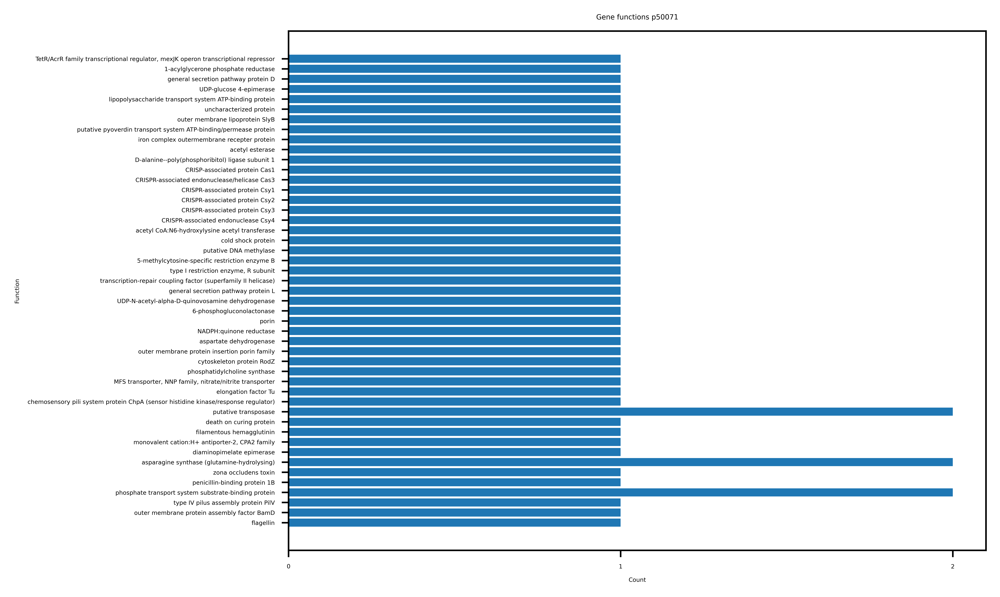

In [608]:
plotting_function_histogram(p50071gene_dict, "p50071")

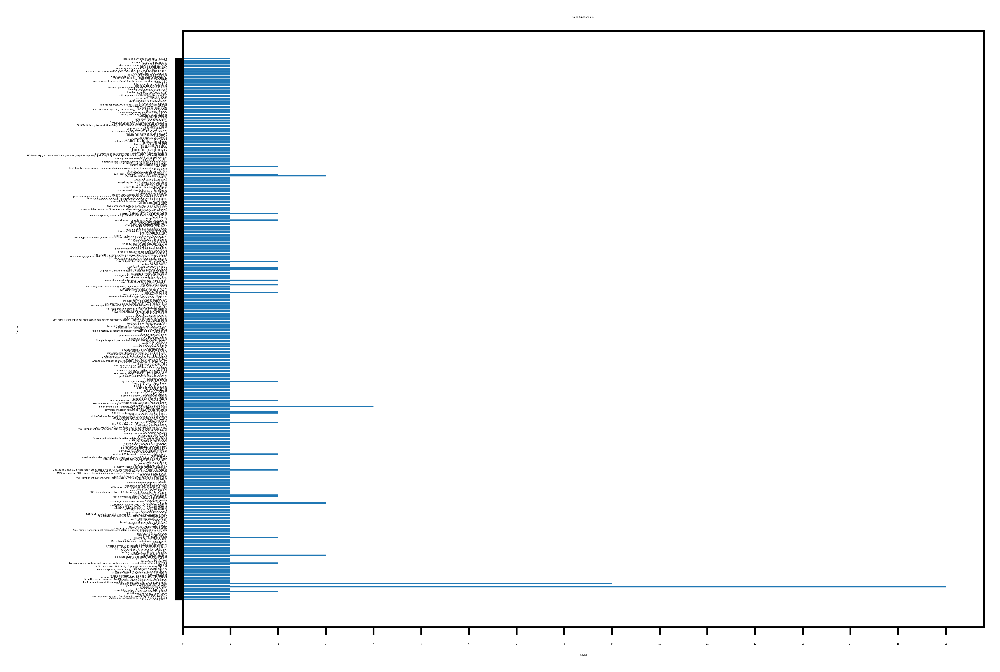

In [609]:
plotting_function_histogram(p13gene_dict, "p13")

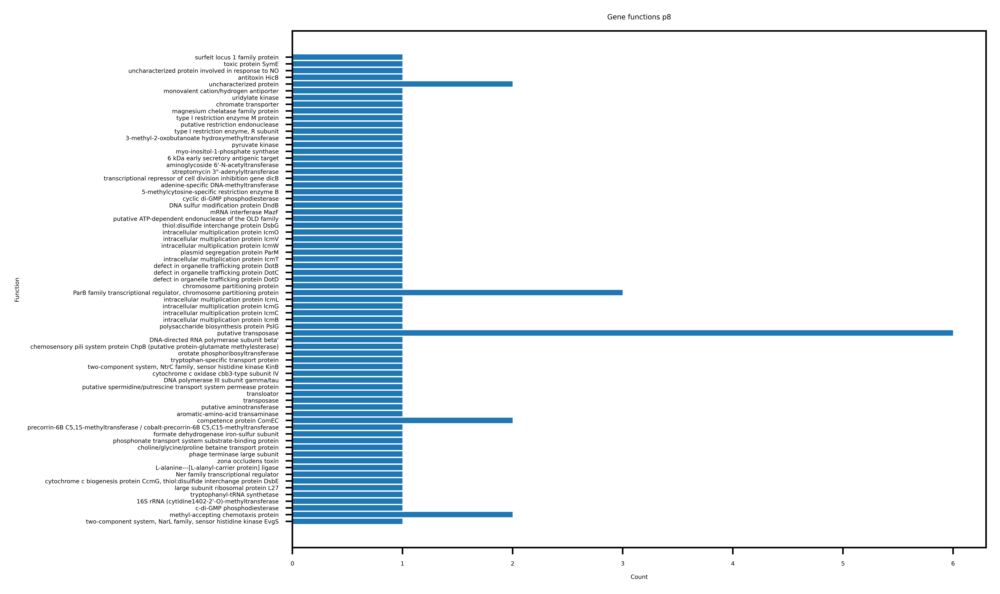

In [610]:
plotting_function_histogram(p8gene_dict, "p8")

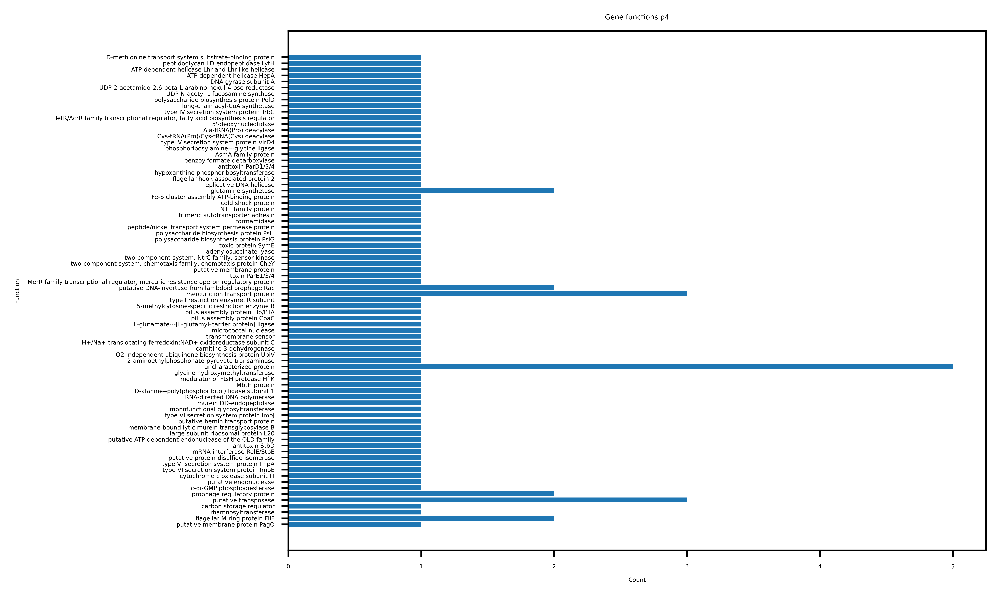

In [611]:
plotting_function_histogram(p4gene_dict, "p4")

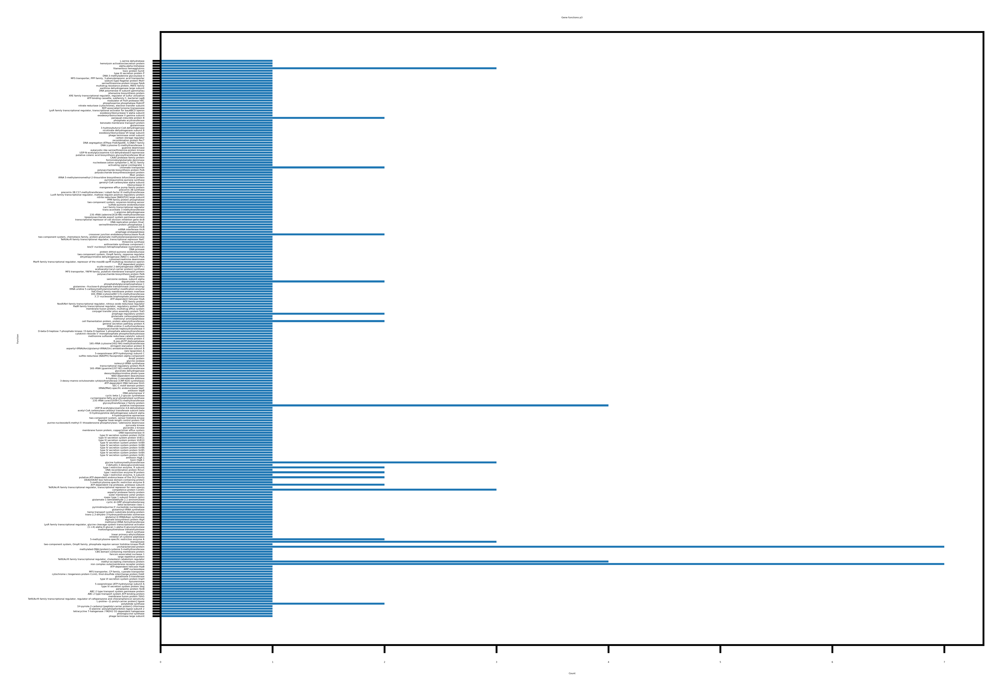

In [612]:
plotting_function_histogram(p3gene_dict, "p3")

In [720]:
def plot_all_on_1(gene_dict1, gene_dict2, gene_dict3, gene_dict4, gene_dict5):
    functions1 = list(gene_dict1.values())
    functions2 = list(gene_dict2.values())
    functions3 = list(gene_dict3.values())
    functions4 = list(gene_dict4.values())
    functions5 = list(gene_dict5.values())
    
    func_count_dict1 = {}
    func_count_dict2 = {}
    func_count_dict3 = {}
    func_count_dict4 = {}
    func_count_dict5 = {}
    
    for i in range(len(functions1)):
        if functions1[i] in func_count_dict1.keys():
            func_count_dict1[functions1[i]] += 1
        else:
            func_count_dict1[functions1[i]] = 1
    
    for i in range(len(functions2)):
        if functions2[i] in func_count_dict2.keys():
            func_count_dict2[functions2[i]] += 1
        else:
            func_count_dict2[functions2[i]] = 1         
            
    for i in range(len(functions3)):
        if functions3[i] in func_count_dict3.keys():
            func_count_dict3[functions3[i]] += 1
        else:
            func_count_dict3[functions3[i]] = 1       
            
    for i in range(len(functions4)):
        if functions4[i] in func_count_dict4.keys():
            func_count_dict4[functions4[i]] += 1
        else:
            func_count_dict4[functions4[i]] = 1
    
    for i in range(len(functions5)):
        if functions5[i] in func_count_dict5.keys():
            func_count_dict5[functions5[i]] += 1
        else:
            func_count_dict5[functions5[i]] = 1
    
    all_functions_redundant = functions1 + functions2 + functions3 + functions4 + functions5
    all_functions = list(set(all_functions_redundant))
    
    count1 = [] 
    count2 = []
    count3 = []
    count4 = []
    count5 = []
    
    for i in range(len(all_functions)):
        if all_functions[i] in func_count_dict1.keys():
            count1.append(func_count_dict1[all_functions[i]])
        else:
            count1.append(0)
        if all_functions[i] in func_count_dict2.keys():
            count2.append(func_count_dict2[all_functions[i]])
        else:
            count2.append(0)
        if all_functions[i] in func_count_dict3.keys():
            count3.append(func_count_dict3[all_functions[i]])
        else:
            count3.append(0)
        if all_functions[i] in func_count_dict4.keys():
            count4.append(func_count_dict4[all_functions[i]])
        else:
            count4.append(0)
        if all_functions[i] in func_count_dict5.keys():
            count5.append(func_count_dict5[all_functions[i]])
        else:
            count5.append(0)    
        
    chart_data = {'p13': count1, 'p50071': count2, "p3": count3, "p4": count4, "p8": count5}
    
    data_frame = pd.DataFrame(chart_data, columns = ["p13", "p50071", "p3", "p4", "p8"], index = all_functions)
    
    data_frame.plot.barh()
    
    plt.figure(dpi=1200)
    plt.rcParams.update({'font.size': 2.0})
    plt.xticks(range(0,20))
    plt.ylabel('Functions')
    plt.xlabel('Counts')
    plt.title('Functions in all bacterias')
    plt.show()
    
    
    
    
    
    
    
    
    
    
    

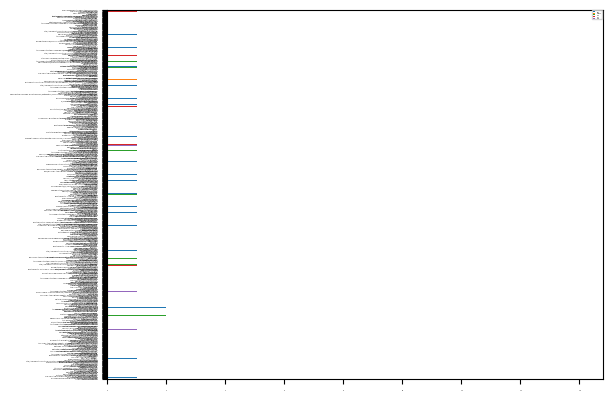

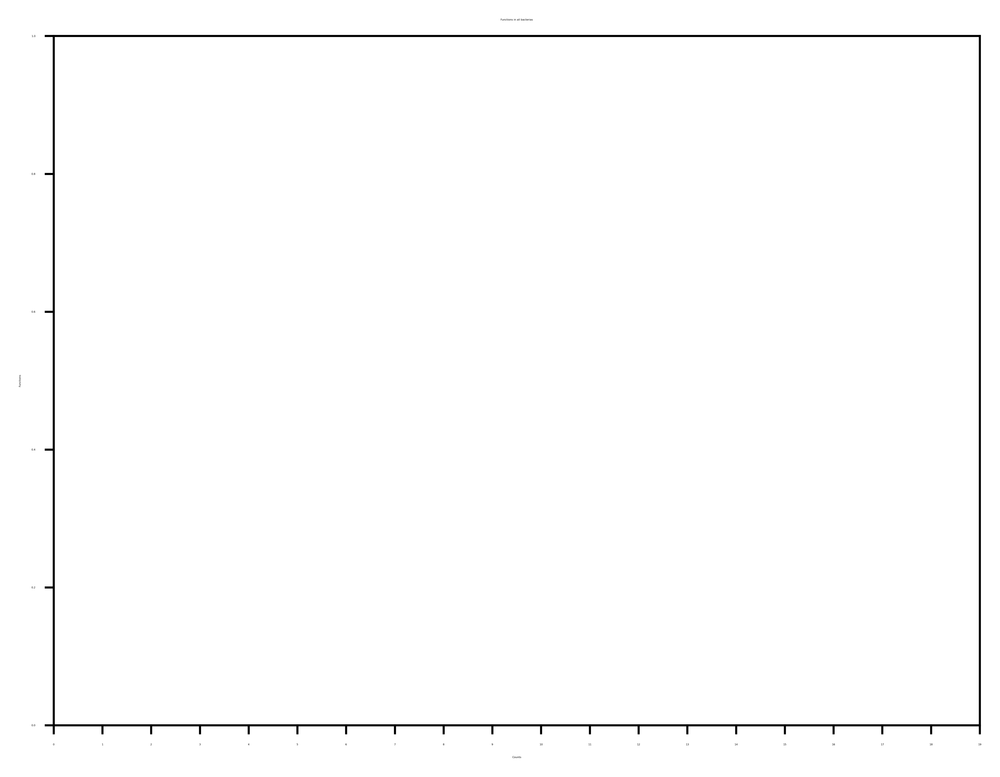

In [648]:
plot_all_on_1(p13gene_dict, p50071gene_dict, p3gene_dict, p4gene_dict, p8gene_dict)

In [716]:
print(p13_annotation)

{'gene_29|GeneMark.hmm|690_aa|+|27515|29587': 'Two-component system', 'gene_31|GeneMark.hmm|885_aa|+|30300|32957': 'Two-component system', 'gene_180|GeneMark.hmm|908_aa|-|172961|175687': 'Nitrogen metabolism', 'gene_196|GeneMark.hmm|399_aa|+|192984|194183': 'Aminoacyl-tRNA biosynthesis', 'gene_275|GeneMark.hmm|175_aa|+|278517|279044': 'Bacterial secretion', 'gene_338|GeneMark.hmm|766_aa|+|354872|357172': 'Cysteine and', 'gene_344|GeneMark.hmm|734_aa|+|361478|363682': 'Purine metabolism', 'gene_358|GeneMark.hmm|308_aa|+|382639|383565': 'Purine metabolism', 'gene_436|GeneMark.hmm|123_aa|+|442009|442380': 'Tyrosine metabolism', 'gene_463|GeneMark.hmm|564_aa|+|470669|472363': 'Two-component system', 'gene_495|GeneMark.hmm|453_aa|+|507612|508973': 'Pentose and', 'gene_615|GeneMark.hmm|709_aa|+|645517|647646': 'Tryptophan metabolism', 'gene_647|GeneMark.hmm|640_aa|+|681310|683232': 'Two-component system', 'gene_688|GeneMark.hmm|527_aa|+|720993|722576': 'Pentose and', 'gene_702|GeneMark.hmm|4

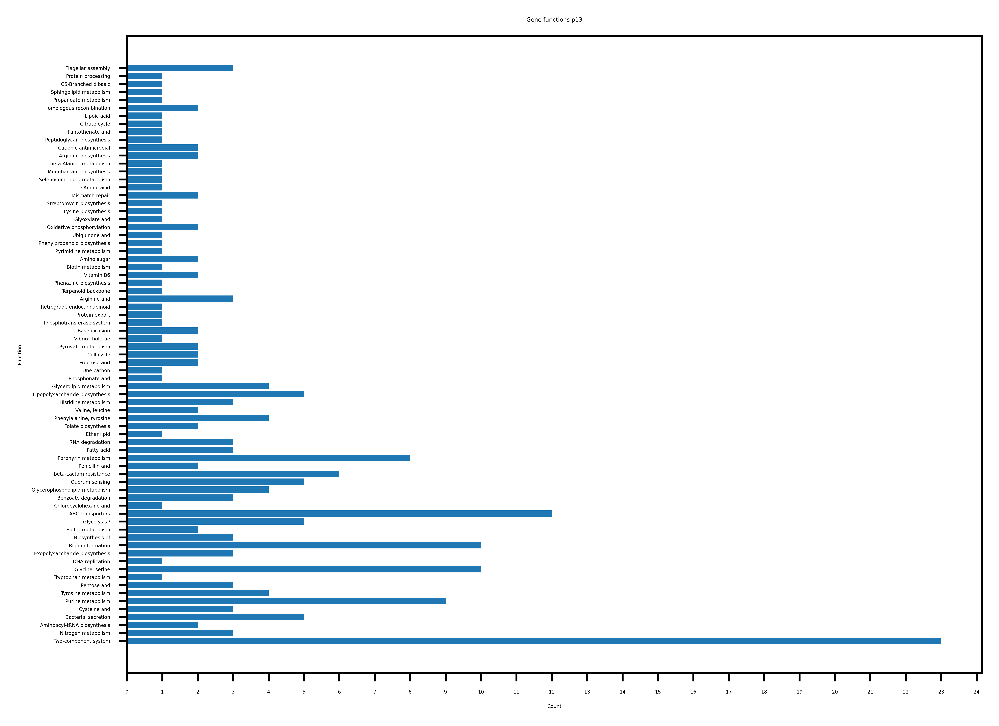

In [723]:
plotting_function_histogram(p13_annotation, "p13")

In [727]:
p3_annotation

{'gene_101|GeneMark.hmm|885_aa|-|106350|109007': 'Cationic antimicrobial',
 'gene_390|GeneMark.hmm|240_aa|+|380641|381363': 'Lipopolysaccharide biosynthesis',
 'gene_393|GeneMark.hmm|538_aa|+|382957|384573': 'Phenylalanine metabolism',
 'gene_432|GeneMark.hmm|250_aa|+|423616|424368': 'Nicotinate and',
 'gene_517|GeneMark.hmm|323_aa|-|66364|67335': 'Glycine, serine',
 'gene_589|GeneMark.hmm|943_aa|+|149284|152115': 'Aminoacyl-tRNA biosynthesis',
 'gene_601|GeneMark.hmm|404_aa|+|161490|162704': 'Thiamine metabolism',
 'gene_639|GeneMark.hmm|861_aa|+|207004|209589': 'Sulfur metabolism',
 'gene_643|GeneMark.hmm|309_aa|+|212456|213385': 'Glutathione metabolism',
 'gene_668|GeneMark.hmm|481_aa|-|243689|245134': 'Aminoacyl-tRNA biosynthesis',
 'gene_847|GeneMark.hmm|266_aa|-|425496|426296': 'Two-component system',
 'gene_1116|GeneMark.hmm|506_aa|-|270427|271947': 'Lipopolysaccharide biosynthesis',
 'gene_1132|GeneMark.hmm|345_aa|-|289009|290046': 'Lipopolysaccharide biosynthesis',
 'gene_1176

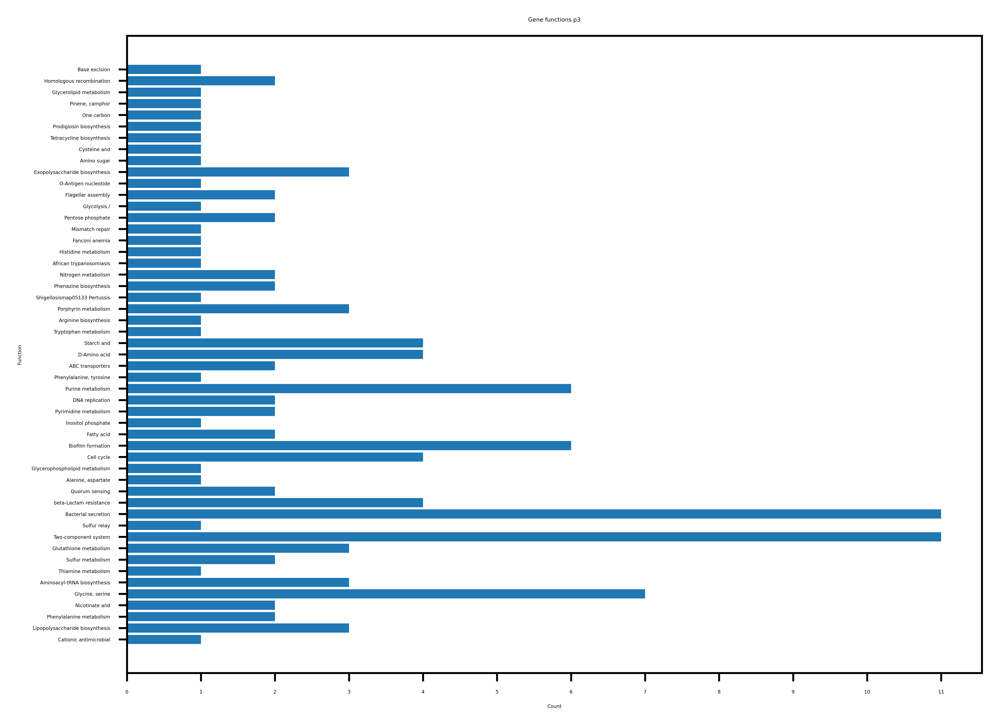

In [728]:
plotting_function_histogram(p3_annotation, "p3")

In [730]:
p50071_annotation

{'gene_412|GeneMark.hmm|2474_aa|+|445785|453209': 'Two-component system',
 'gene_659|GeneMark.hmm|400_aa|+|705151|706353': 'Plant-pathogen interaction',
 'gene_1064|GeneMark.hmm|431_aa|+|1143916|1145211': 'Nitrogen metabolism',
 'gene_1080|GeneMark.hmm|238_aa|+|1165603|1166319': 'Glycerophospholipid metabolism',
 'gene_1447|GeneMark.hmm|267_aa|+|1573056|1573859': 'Nicotinate and',
 'gene_1782|GeneMark.hmm|238_aa|+|1921658|1922374': 'Pentose phosphate',
 'gene_1810|GeneMark.hmm|153_aa|+|1954694|1955155': 'Alanine, aspartate',
 'gene_1814|GeneMark.hmm|272_aa|+|1957618|1958436': 'O-Antigen nucleotide',
 'gene_1861|GeneMark.hmm|382_aa|+|2008719|2009867': 'Bacterial secretion',
 'gene_1952|GeneMark.hmm|1150_aa|-|2119894|2123346': 'Nucleotide excision',
 'gene_2441|GeneMark.hmm|464_aa|-|2614636|2616030': 'ABC transporters',
 'gene_2560|GeneMark.hmm|286_aa|+|2755567|2756427': 'Biosynthesis of',
 'gene_2595|GeneMark.hmm|4991_aa|+|2816067|2831042': 'D-Amino acid',
 'gene_2598|GeneMark.hmm|550_a

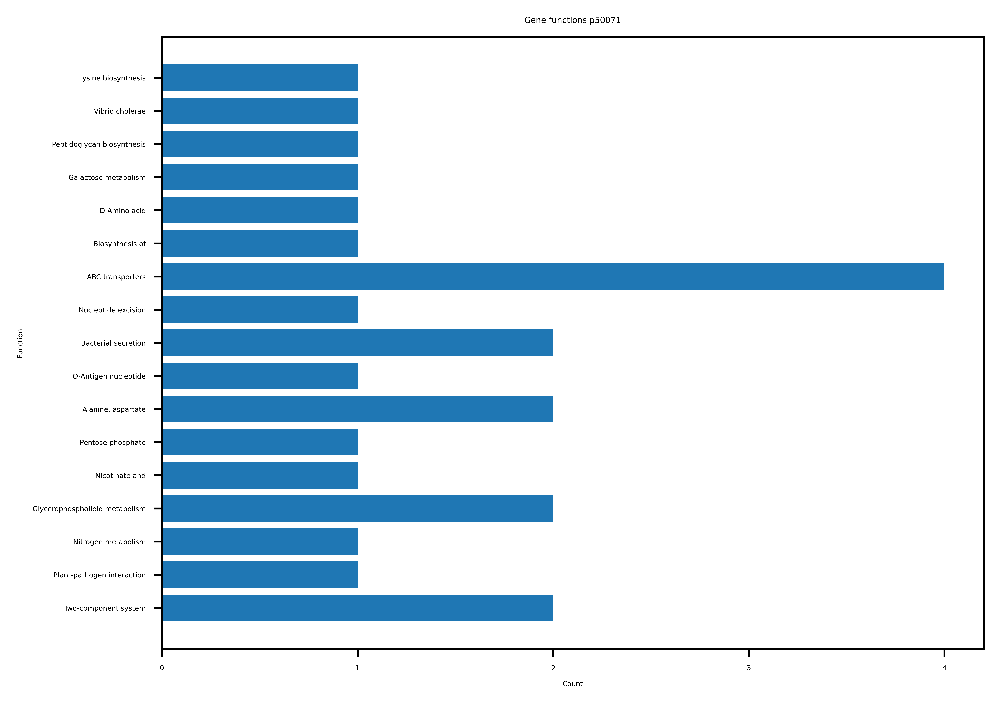

In [731]:
plotting_function_histogram(p50071_annotation, "p50071")

In [734]:
p4_annotation

{'gene_67|GeneMark.hmm|201_aa|+|60750|61355': 'Purine metabolism',
 'gene_544|GeneMark.hmm|549_aa|+|216840|218489': 'Aminobenzoate degradation',
 'gene_590|GeneMark.hmm|435_aa|-|264902|266209': 'Purine metabolism',
 'gene_668|GeneMark.hmm|666_aa|+|4972|6972': 'Bacterial secretion',
 'gene_1140|GeneMark.hmm|204_aa|-|220744|221358': 'Purine metabolism',
 'gene_1278|GeneMark.hmm|109_aa|+|119389|119718': 'Quorum sensing',
 'gene_1326|GeneMark.hmm|568_aa|+|170060|171766': 'Fatty acid',
 'gene_1466|GeneMark.hmm|458_aa|-|83706|85082': 'Biofilm formation',
 'gene_1552|GeneMark.hmm|376_aa|-|188098|189228': 'O-Antigen nucleotide',
 'gene_1553|GeneMark.hmm|171_aa|-|189239|189754': 'O-Antigen nucleotide',
 'gene_2107|GeneMark.hmm|262_aa|-|110160|110948': 'ABC transporters',
 'gene_2330|GeneMark.hmm|313_aa|-|127407|128348': 'Two-component system',
 'gene_2700|GeneMark.hmm|292_aa|+|123289|124167': 'Flagellar assembly',
 'gene_2701|GeneMark.hmm|324_aa|+|124121|125095': 'Flagellar assembly',
 'gene_27

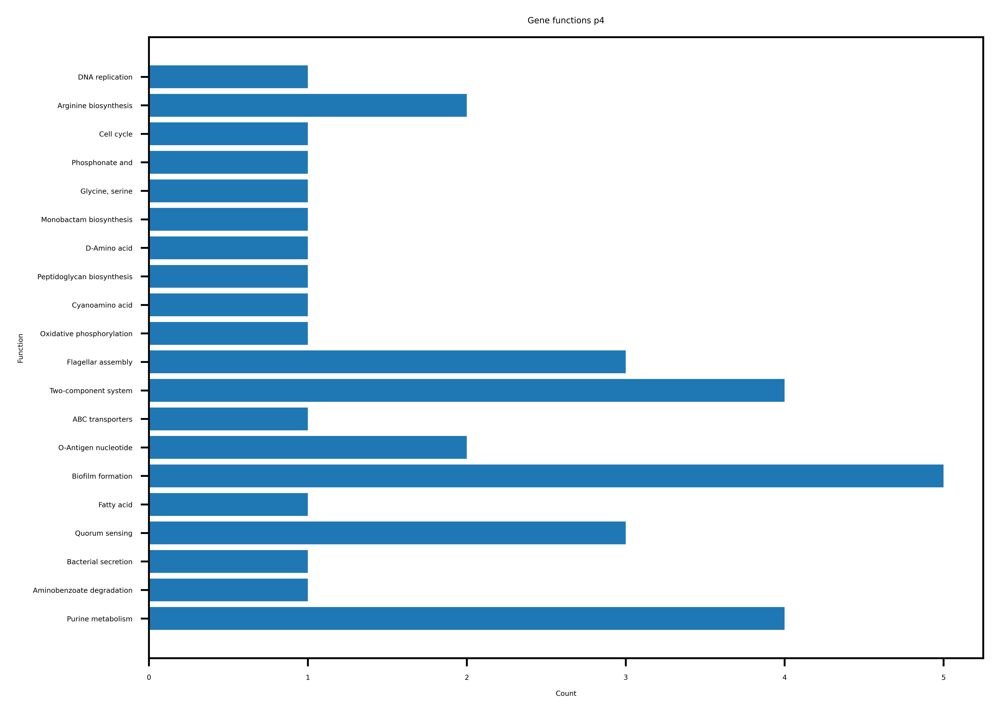

In [735]:
plotting_function_histogram(p4_annotation, "p4")

In [736]:
p8_annotation

{'gene_281|GeneMark.hmm|309_aa|+|327425|328354': 'Glyoxylate and',
 'gene_483|GeneMark.hmm|415_aa|+|83152|84399': 'Porphyrin metabolism',
 'gene_721|GeneMark.hmm|398_aa|+|344336|345532': 'Cysteine and',
 'gene_732|GeneMark.hmm|380_aa|-|356262|357404': 'O-Antigen nucleotide',
 'gene_1356|GeneMark.hmm|390_aa|+|26433|27605': 'Yersinia infection',
 'gene_1742|GeneMark.hmm|415_aa|+|190151|191398': 'Quorum sensing',
 'gene_1809|GeneMark.hmm|680_aa|+|24932|26974': 'DNA replication',
 'gene_1830|GeneMark.hmm|64_aa|-|45449|45643': 'Oxidative phosphorylation',
 'gene_2131|GeneMark.hmm|595_aa|-|131529|133316': 'Two-component system',
 'gene_2289|GeneMark.hmm|961_aa|-|95491|98376': 'Two-component system',
 'gene_2745|GeneMark.hmm|245_aa|-|164700|165437': 'Pyrimidine metabolism',
 'gene_2995|GeneMark.hmm|633_aa|+|4249|6150': 'Two-component system',
 'gene_3055|GeneMark.hmm|517_aa|+|62287|63840': 'Biofilm formation',
 'gene_3128|GeneMark.hmm|455_aa|-|139314|140681': 'Aminoacyl-tRNA biosynthesis',
 '

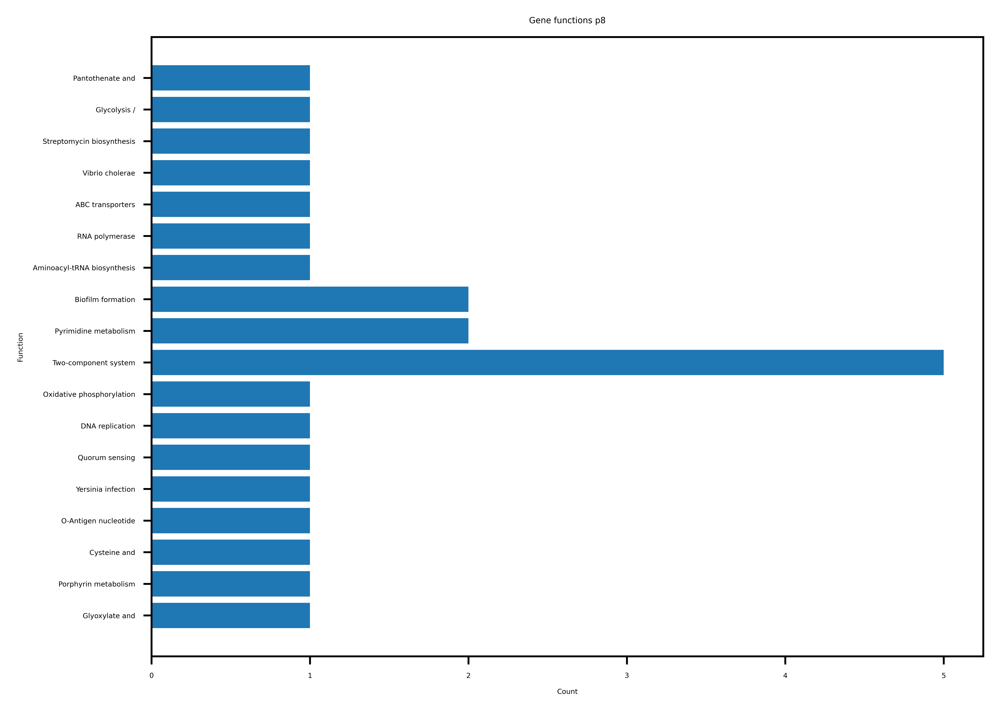

In [737]:
plotting_function_histogram(p8_annotation, "p8")